### fonction de la descente stochastique

In [1]:
import numpy as np

def sgd(
    gradient, X, y, start, learning_rate=1e-4, n_epoch = 1
):  
    n_obs = X.shape[0]
    y = np.array(y)
    Xy = np.concatenate((X,y.reshape(y.shape[0],1)), axis=1)
    
    rng = np.random.default_rng()
    vector = np.array(start)
    deplacement = []
    deplacement.append(vector.tolist())
    for _ in range(n_epoch):
        rng.shuffle(Xy)
        for i in range(n_obs):
            xi, yi = Xy[i, :-1], Xy[i, -1:]
            grad = np.array(gradient(xi, yi, vector))
            vector -= learning_rate * grad
            deplacement.append(vector.tolist())
    return deplacement

### fonction de l'optimisation adagrad

In [2]:

def adagrad(
    gradient, X, y, start, learning_rate=1e-4, n_epoch = 1, e = 1e-8
):  
    n_obs = X.shape[0]
    dim = X.shape[1]
    y = np.array(y)
    Xy = np.concatenate((X,y.reshape(y.shape[0],1)), axis=1)
    
    rng = np.random.default_rng()
    vector = np.array(start)
    
    deplacement = []
    deplacement.append(vector.tolist())
    G = np.zeros(dim)
    for _ in range(n_epoch):
        rng.shuffle(Xy)
        for i in range(n_obs):
            xi, yi = Xy[i, :-1], Xy[i, -1:]
            grad = np.array(gradient(xi, yi, vector))
            G += grad*grad
            vector -= (learning_rate * grad) / np.sqrt(G + e)
            
            deplacement.append(vector.tolist())
    return deplacement

### fonction d'evaluation rss et fonction f(x,y)=x²+y²

afin d'utiliser les fonctions deja ecrite il faudrait construire un ensemble de donnees inutiles vu qu'ils ne sont pas dependances 

en posant u = (x,y), f(u) = <u,u> et le grad f(u)= 2u

In [3]:
#> fonctions f(u) = <u,u>
def f(X,y, u):
    return np.dot(u,u)

def grad(X, y, u):
    return 2*u


def sigmoide(x):
    return 1/(1+np.exp(-x))

#> fonctions rss
# -- pour optimisation batch
def rss(X, y, b):
    a = y - sigmoide(np.dot(X, b))
    return np.dot(a.T, a)
    
# gradient de rss
def grad_rss(X, y, b):
    a = sigmoide(np.dot(X, b))
    return  2 * np.dot(X.T, (y - a)*(a - 1)*a)

# -- optimisation stokastique 
def rss_(x, y, b):
    a = y - sigmoide(np.dot(x, b))
    return a*a
    
def grad_rss_(x, y, b):
    a = sigmoide(np.dot(x, b))
    return  2 * (a - y)*a*(1 - a)*x


### Optimisation de la fonction f(u)=<u,u>

* generation des donnees synthetiques inutiles 

In [4]:
X = np.random.randint(0,7,(10,2))
y = np.random.randint(0,2,10)

#point de depart au choix 
start = np.array([7,1.5])

#valeur du vecteur de depart
f(X, y,start)

51.25

- optimisation avec sgd

In [5]:
#ensemble des deplacements du vecteur initiale
dep_sgd = sgd(grad, X,y, start, learning_rate=1e-3)

#valeur de deplacement de sgd
f(X,y,dep_sgd[-1])

49.23848654760007

- optimisation avec adagrad

In [6]:
#ensemble des deplacements du vecteur initiale
dep_adagrad = adagrad(grad, X,y, start, learning_rate=1e-1)

#valeur deplacement de adagrad 
f(X,y,dep_adagrad[-1])

43.382842783274405

- sauvegarde des deplacements pour l'affichage

In [7]:
fichier = open("sgd_deplacement_f.txt", "w")
fichier.write("x;y\n")
for e in dep_sgd:
    fichier.write(str(e[0]))
    fichier.write(";")
    fichier.write(str(e[1]))
    fichier.write("\n")
fichier.close()

fichier = open("adagrad_deplacement_f.txt", "w")
fichier.write("x;y\n")
for e in dep_adagrad:
    fichier.write(str(e[0]))
    fichier.write(";")
    fichier.write(str(e[1]))
    fichier.write("\n")
fichier.close()

- visualisation des deplacements

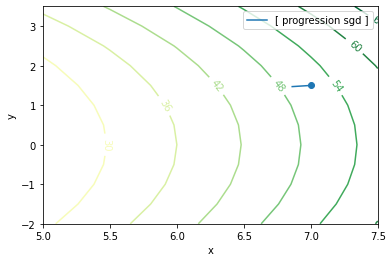

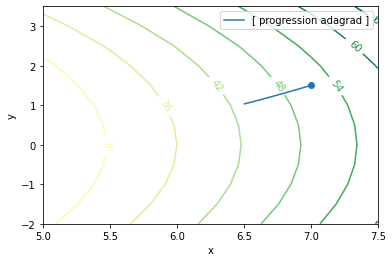

In [8]:
import matplotlib.pyplot as plt
import pandas as pd

def f_(x,y):
    return x**2 + y**2


X = np.arange(5, 8, 0.5)
Y = np.arange(-2, 4, 0.5)
X, Y = np.meshgrid(X, Y)
Z = f_(X, Y)


plt.figure(1)
plt.xlabel('x')
plt.ylabel('y')

cont=plt.contour(X, Y, Z,cmap="YlGn")
plt.clabel(cont,fmt='%d')

data=pd.read_table("sgd_deplacement_f.txt",sep=';')
a=data.values[:,0]
b=data.values[:,1]
plt.scatter(a[0],b[0])
plt.plot(a,b,label="[ progression sgd ]")

plt.legend()
plt.show()

plt.figure(1)
plt.xlabel('x')
plt.ylabel('y')

cont=plt.contour(X, Y, Z,cmap="YlGn")
plt.clabel(cont,fmt='%d')

data=pd.read_table("adagrad_deplacement_f.txt",sep=';')
a=data.values[:,0]
b=data.values[:,1]
plt.scatter(a[0],b[0])
plt.plot(a,b,label="[ progression adagrad ]")

plt.legend()
plt.show()

### Optimisation de la fonction rss

- generation des donnees synthetiques

un tableau de donnees à 2 caracteristiques et une caracteristique pour realiser une visualisation ed la fonction rss a la suite

In [9]:
from wrt import grad_rss_, rss

X = np.random.randint(0,20,(100,2))
y = np.random.randint(0,2,100)

start = np.random.rand(2)
print(start)
print(rss(X,y,start))

[0.37493154 0.87792921]
45.13519216860622


- sauvegarde des donnees synthethiques

In [10]:
fichier = open("data_synthetique_rss.txt", "w")
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        fichier.write(str(X[i][j])+";")
    fichier.write(str(y[i])+"\n")
fichier.close()

- une visualisation de la fonction rss

/tmp/ipykernel_4248/1469129920.py:23: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


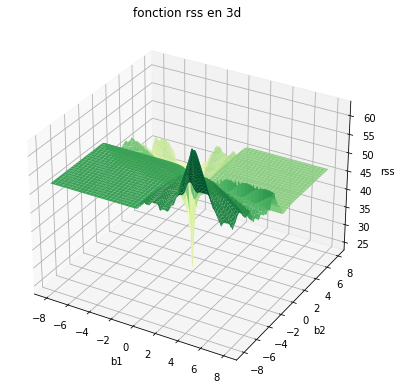

In [11]:
from mpl_toolkits.mplot3d import Axes3D

data=pd.read_table("data_synthetique_rss.txt",sep=';')

# construction de la grille de l'axe x=b1 et y=b2
X = np.array(data.values[:,:-1])
y = np.array(data.values[:,-1:])
y = y.reshape(y.shape[0])

b1 = np.arange(-8, 8, 0.05)
b2 = np.arange(-8, 8, 0.05)
B1, B2 = np.meshgrid(b1, b2)
RSS = np.zeros((B1.shape[0], B1.shape[1]))

# contruction des valeurs de la fonction pour chaques valeurs de grilles
for i in range(B1.shape[0]):
    for j in range(B1.shape[1]):
        b=np.array([B1[i][j],B2[i][j]])
        RSS[i][j] = rss(X,y,b)

# code de visualisation contraite
fig = plt.figure(figsize=(5,5))
ax = Axes3D(fig)
ax.set_title("fonction rss en 3d")
ax.set_xlabel("b1")
ax.set_ylabel("b2")
ax.set_zlabel("rss")
ax.plot_surface(B1, B2, RSS, cmap="YlGn")

- optimisation avec sgd

In [12]:
#ensemble des deplacements du vecteur initiale
dep_sgd = sgd(grad_rss_, X,y, start, n_epoch=300, learning_rate=1e-1)

#valeur du dernier deplacement 
print(rss(X,y,dep_sgd[-1]))

36.6614692917448


- optimisation avec adagrad

In [13]:
#ensemble des deplacements du vecteur initiale
dep_adagrad = adagrad(grad_rss_, X,y, start, n_epoch=20, learning_rate=1e-4)

#valeur du dernier deplacement 
print(rss(X,y,dep_adagrad[-1]))

45.12856589681888


- visualisation des deplacements

Il faut noter ici que, comme l'utilisation dans un notebook de matplotlib dans un notebook ne permet pas de voir completement la fonction, nous avons utiliser la biblioteque `plotly` instable par la commande `pip install plotly` 

In [14]:
import plotly.graph_objects as go

fig = (go.Figure(data=[go.Surface(z=RSS, x=B1, y=B2, colorscale='YlGn', opacity = 0.7, reversescale=True)]))

data=pd.read_table("sgd_deplacement_rss.txt",sep=';')
dep=data.values
z = []
for i in range(data.shape[0]):
    z.append( rss(X,y, dep[i]).tolist() )
fig.add_scatter3d(x=dep[:,0], y=dep[:,1], z=z, mode='markers', marker=dict(size=3, colorscale='YlGn', opacity = 0.9))

data=pd.read_table("adagrad_deplacement_rss.txt",sep=';')
dep=data.values
z = []
for i in range(data.shape[0]):
    z.append( rss(X,y, dep[i]).tolist() )
fig.add_scatter3d(x=dep[:,0], y=dep[:,1], z=z, mode='markers', marker=dict(size=3, colorscale='YlGn', opacity = 0.9))

fig.update_layout(template= "plotly_dark", margin=dict(l=0, r=0, b=0, t=0))
fig.layout.scene.camera.projection.type = "orthographic"
fig.show()